In [1]:
import numpy as np
import jax.numpy as jnp
from jax import nn, jacfwd, jit, vmap, lax, random
from jax.scipy.stats.norm import cdf, pdf
from functools import partial
import time

from scipy.stats import linregress
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler

# update plot parameters
params = {'legend.fontsize': 12,
          'figure.figsize': (12, 9),
          'lines.linewidth':4,
         'axes.labelsize': 20,
         'axes.titlesize':24,
          'axes.linewidth':2,
         'xtick.labelsize':22,
         'ytick.labelsize':22}
plt.rcParams.update(params)
plt.rcParams['pdf.fonttype'] = 42

np.random.seed(123)

class FFNN():

    def __init__(self, n_inputs, n_hidden, n_outputs, alpha_0=1e-3):

        # set rng key
        self.rng_key = random.PRNGKey(123)
        
        # store dimensions
        self.n_inputs = n_inputs
        self.n_hidden = n_hidden
        self.n_outputs = n_outputs

        # initial level of regularization
        self.alpha_0 = alpha_0
        
        # determine shapes of weights/biases = [Wih, bih, Who, bho]
        self.shapes = [[n_hidden, n_inputs], [n_hidden], [n_outputs, n_hidden], [n_outputs]]
        self.k_params = []
        self.n_params = 0
        for shape in self.shapes:
            self.k_params.append(self.n_params)
            self.n_params += np.prod(shape)
        self.k_params.append(self.n_params)

        # initialize parameters
        self.params = np.zeros(self.n_params)
        for k1,k2,shape in zip(self.k_params, self.k_params[1:], self.shapes):
            if len(shape)>1:
                stdv = 1/np.sqrt(shape[-1])
            # self.params[k1:k2] = np.random.uniform(-self.param_0, self.param_0, k2-k1)
            # self.params[k1:k2] = stdv*np.random.randn(k2-k1)
            self.params[k1:k2] = stdv*random.normal(self.rng_key, shape=(k2-k1,))

        # initialize hyper-parameters
        self.a = 1e-4
        self.b = 1e-4
            
        # initialize covariance 
        self.Ainv = None
            
        ### define jit compiled functions ###

        # batch prediction
        self.forward_batch = jit(vmap(self.forward, in_axes=(None, 0)))
        
        # jit compile gradient w.r.t. params
        self.G  = jit(jacfwd(self.forward_batch))
        self.Gi = jit(jacfwd(self.forward))

        # jit compile Newton update direction computation
        def NewtonStep(G, g, alpha, Beta):
            # compute hessian
            A = jnp.diag(alpha) + jnp.einsum('nki,kl,nlj->ij', G, Beta, G)
            # solve for Newton step direction
            d = jnp.linalg.solve(A, g)
            return d
        self.NewtonStep = jit(NewtonStep)

        # jit compile inverse Hessian computation step
        def Ainv_next(G, Ainv, BetaInv):
            GAinv = G@Ainv
            Ainv_step = GAinv.T@jnp.linalg.inv(BetaInv + GAinv@G.T)@GAinv
            Ainv_step = (Ainv_step + Ainv_step.T)/2.
            return Ainv_step
        self.Ainv_next = Ainv_next

        # jit compile measurement covariance computation
        def compute_yCOV(errors, G, Ainv):
            return jnp.einsum('nk,nl->kl', errors, errors) + jnp.einsum('nki,ij,nlj->kl', G, Ainv, G)
        self.compute_yCOV = jit(compute_yCOV)

    # reshape parameters into weight matrices and bias vectors
    def reshape(self, params):
        # params is a vector = [Wih, bih, Who, bho]
        return [np.reshape(params[k1:k2], shape) for k1,k2,shape in zip(self.k_params, self.k_params[1:], self.shapes)]

    # per-sample prediction
    def forward(self, params, sample):
        # reshape params
        Wih, bih, Who, bho = self.reshape(params)
        
        # hidden layer
        h = jnp.tanh(Wih@sample + bih)

        # output 
        out = Who@h + bho
        
        return out

    # fit to data
    def fit(self, X, Y, lr=1e-2, map_tol=1e-3, evd_tol=1e-3, patience=3, max_fails=3):
        passes = 0
        fails  = 0
        # fit until convergence of evidence
        previdence = -np.inf
        evidence_converged = False
        epoch = 0
        best_evidence_params = np.copy(self.params)
        best_params = np.copy(self.params)

        while not evidence_converged:

            # update hyper-parameters
            self.update_hypers(X, Y)

            # use Newton descent to determine parameters
            prev_loss = np.inf

            # fit until convergence of NLP
            converged = False
            while not converged:
                # forward passs
                outputs = self.forward_batch(self.params, X)
                errors  = np.nan_to_num(outputs - Y)
                residuals = np.sum(errors)/X.shape[0]

                # compute convergence of loss function
                loss = self.compute_loss(errors)
                convergence = (prev_loss - loss) / max([1., loss])
                # print("Epoch: {}, Loss: {:.5f}, Residuals: {:.5f}, Convergence: {:5f}".format(epoch, loss, residuals, convergence))

                # stop if less than tol
                if abs(convergence) <= map_tol:
                    # set converged to true to break from loop
                    converged = True
                else:
                    # lower learning rate if convergence is negative
                    if convergence < 0:
                        lr /= 2.
                        # re-try with the smaller step
                        self.params = best_params - lr*d
                    else:
                        # update best params
                        best_params = np.copy(self.params)

                        # update previous loss
                        prev_loss = loss

                        # compute gradients
                        G = self.G(self.params, X)
                        g = np.einsum('nk,kl,nli->i', errors, self.Beta, G) + self.alpha*self.params

                        # determine Newton update direction
                        d = self.NewtonStep(G, g, self.alpha, self.Beta)

                        # update parameters
                        self.params -= lr*d

                        # update epoch counter
                        epoch += 1

            # Update Hessian estimation
            G = self.G(self.params, X)
            self.A, self.Ainv = self.compute_precision(G)

            # compute evidence
            evidence = self.compute_evidence(X, loss)

            # determine whether evidence is converged
            evidence_convergence = (evidence - previdence) / max([1., abs(evidence)])
            # print("\nEpoch: {}, Evidence: {:.5f}, Convergence: {:5f}".format(epoch, evidence, evidence_convergence))

            # stop if less than tol
            if abs(evidence_convergence) <= evd_tol:
                passes += 1
                lr *= 2.
            else:
                if evidence_convergence < 0:
                    # reset :(
                    fails += 1
                    self.params = np.copy(best_evidence_params)
                    # Update Hessian estimation
                    G = self.G(self.params, X)
                    self.A, self.Ainv = self.compute_precision(G)

                    # reset evidence back to what it was
                    evidence = previdence
                    # lower learning rate
                    lr /= 2.
                else:
                    passes = 0
                    # otherwise, update previous evidence value
                    previdence = evidence
                    # update measurement covariance
                    self.yCOV = self.compute_yCOV(errors, G, self.Ainv)
                    # update best evidence parameters
                    best_evidence_params = np.copy(self.params)

            # If the evidence tolerance has been passed enough times, return
            if passes >= patience or fails >= max_fails:
                evidence_converged = True
                

    # update hyper-parameters alpha and Beta
    def update_hypers(self, X, Y):
        if self.Ainv is None:
            self.yCOV = np.einsum('nk,nl->kl', np.nan_to_num(Y), np.nan_to_num(Y))
            self.yCOV = (self.yCOV + self.yCOV.T)/2.
            # update alpha
            self.alpha = self.alpha_0*np.ones(self.n_params)
            # update Beta
            self.Beta = X.shape[0]*np.linalg.inv(self.yCOV + 2.*self.b*np.eye(self.n_outputs))
            self.Beta = (self.Beta + self.Beta.T)/2.
            self.BetaInv = np.linalg.inv(self.Beta)
        else:
            # update alpha
            self.alpha = 1. / (self.params**2 + np.diag(self.Ainv) + 2.*self.a)
            # update beta
            self.Beta = X.shape[0]*np.linalg.inv(self.yCOV + 2.*self.b*np.eye(self.n_outputs))
            self.Beta = (self.Beta + self.Beta.T)/2.
            self.BetaInv = np.linalg.inv(self.Beta)

    # compute loss
    def compute_loss(self, errors):
        return 1/2*(np.einsum('nk,kl,nl->', errors, self.Beta, errors) + np.dot(self.alpha*self.params, self.params))

    # compute Precision and Covariance matrices
    def compute_precision(self, G):
        # compute Hessian (precision Matrix)
        A = jnp.diag(self.alpha) + jnp.einsum('nki,kl,nlj->ij', G, self.Beta, G)
        A = (A + A.T)/2.

        # compute inverse precision (covariance Matrix)
        
        Ainv = jnp.diag(1./self.alpha)
        for Gn in G:
            Ainv -= self.Ainv_next(Gn, Ainv, self.BetaInv)
        return A, Ainv

    # compute the log marginal likelihood
    def compute_evidence(self, X, loss):
        # compute evidence
        Hessian_eigs = np.linalg.eigvalsh(self.A)
        evidence = X.shape[0]/2*np.nansum(np.log(np.linalg.eigvalsh(self.Beta))) + \
                   1/2*np.nansum(np.log(self.alpha)) - \
                   1/2*np.nansum(np.log(Hessian_eigs[Hessian_eigs>0])) - loss
        return evidence

    
    # function to predict metabolites and variance
    def predict(self, X):
        # make point predictions
        preds = self.forward_batch(self.params, X)

        # compute sensitivities
        G = self.G(self.params, X)

        # compute covariances
        COV = self.BetaInv + np.einsum("nki,ij,nlj->nkl", G, self.Ainv, G)

        # pull out standard deviations
        get_diag = vmap(jnp.diag, (0,))
        stdvs = np.sqrt(get_diag(COV))

        return preds, stdvs, COV
    
    # function to predict variance at X given precision A
    def conditioned_stdv(self, X, Ainv):

        # compute sensitivities
        G = self.G(self.params, X)

        # compute updated *epistemic* prediction covariance
        COV = np.einsum("nki,ij,nlj->nkl", G, Ainv, G) + self.BetaInv

        # pull out standard deviations
        get_diag = vmap(jnp.diag, (0,))
        stdvs = np.sqrt(get_diag(COV))

        return stdvs
    
    # return indeces of optimal samples
    def search(self, data, objective, N, max_reps=1, batch_size=512, exploit=True):

        # determine number of samples to search over
        n_samples = data.shape[0]
        batch_size = min([n_samples, batch_size])

        # make predictions once
        all_preds  = []
        for batch_inds in np.array_split(np.arange(n_samples), n_samples//batch_size):
            # make predictions on data
            all_preds.append(self.forward_batch(self.params, data[batch_inds]))
        
        # compute objective (f: R^[n_t, n_o, w_exp] -> R) in batches
        objective_batch = jit(vmap(lambda pred, stdv: objective(pred, stdv), (0,0)))

        # initialize conditioned parameter covariance
        Ainv_q = jnp.copy(self.Ainv)

        # search for new experiments until find N
        best_experiments = []
        while len(best_experiments) < N:

            # compute utilities in batches to avoid memory problems
            utilities = []
            for preds, batch_inds in zip(all_preds, np.array_split(np.arange(n_samples), n_samples//batch_size)):
                stdvs = self.conditioned_stdv(data[batch_inds], Ainv_q)
                if exploit:
                    utilities.append(objective_batch(preds, stdvs))
                else:
                    utilities.append(stdvs)
            utilities = jnp.concatenate(utilities)
            # print("Top 5 utilities: ", jnp.sort(utilities)[::-1][:5])
            
            # pick an experiment
            # print(f"Picked experiment {len(best_experiments)} out of {N}")
            exp = np.argmax(utilities)

            # add experiment to the list 
            if sum(np.in1d(best_experiments, exp)) < max_reps:
                best_experiments += [exp.item()]

                # compute sensitivity to sample
                Gi = self.Gi(self.params, data[exp])

                # update conditioned parameter covariance
                Ainv_q -= self.Ainv_next(Gi, Ainv_q, self.BetaInv)
            elif exploit:
                print("Max replicates exceeded, switching to pure exploration")
                exploit=False
            else:
                print("Max exploration replicates exceeded, terminating")
                return best_experiments

        return np.sort(best_experiments)

In [2]:
# COSINES
def f(x):
    x, y = x
    u = 1.6*x - .5
    v = 1.6*y - .5
    return 1 - (u**2 + v**2 - .3*np.cos(3*np.pi*u) - .3*np.cos(3*np.pi*v))

# ROSENBROCK
# def f(x):
#     x, y = x
#     return 10 - 100*(y - x**2)**2 - (1-x)**2

def generate_data(X, noise=0.):
    Nsamples = X.shape[0]
    Y = np.zeros([Nsamples, 1])
    
    for i in range(Nsamples):
        # add some standard Gaussian noise to Y
        Y[i] = f(X[i]) + noise*np.random.randn()

    return Y

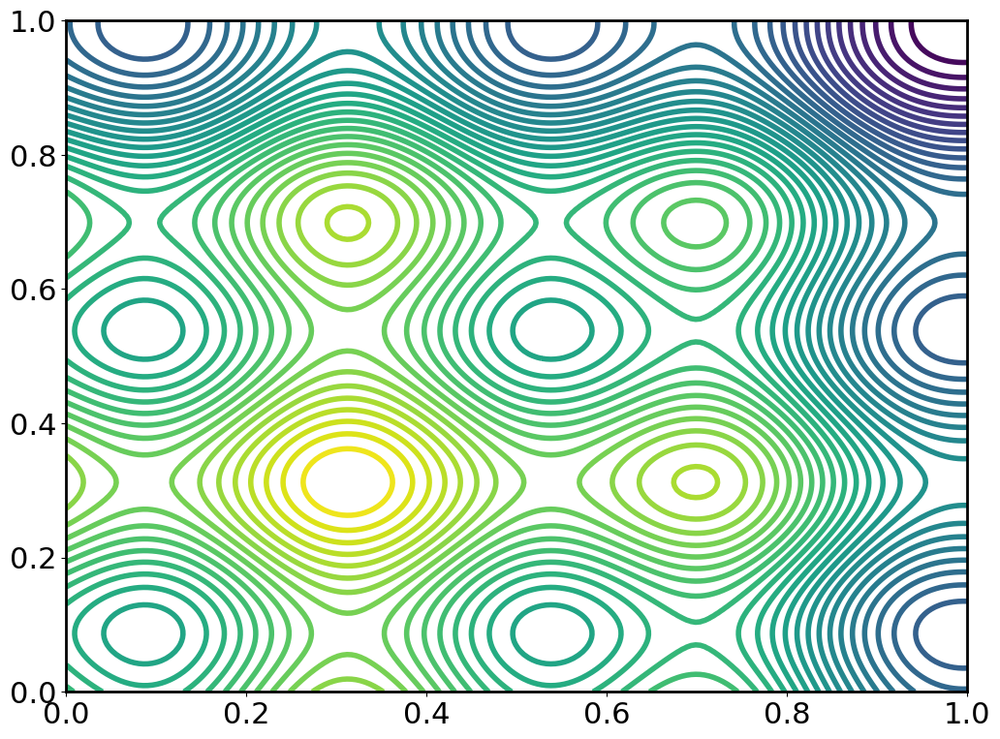

In [3]:
# define design space
n_grid = 200
F_grid = np.zeros([n_grid, n_grid])
X = np.linspace(0, 1, n_grid)
Y = np.linspace(0, 1, n_grid)
Xmesh,Ymesh = np.meshgrid(X,Y)

# test datapoints
X_design = np.stack([Xmesh.ravel(), Ymesh.ravel()]).T
Y_design = generate_data(X_design)

for i, xi in enumerate(X):
    for j, yj in enumerate(Y):
        F_grid[j,i] = f([xi,yj])
        
plt.contour(Xmesh, Ymesh, F_grid, levels=np.linspace(np.min(F_grid), np.max(F_grid), n_grid//5))   
plt.savefig("Results/objective.pdf")
plt.show()

In [4]:
# define number of test points
n_init = 10
n_test = 10
n_cycles = 5
n_hidden = 10
noise = .05 # .05 = ~10% of variation in response without noise

# train data points
X_train = np.random.uniform(size=[n_init, 2])
Y_train = generate_data(X_train, noise=noise)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


Max replicates exceeded, switching to pure exploration


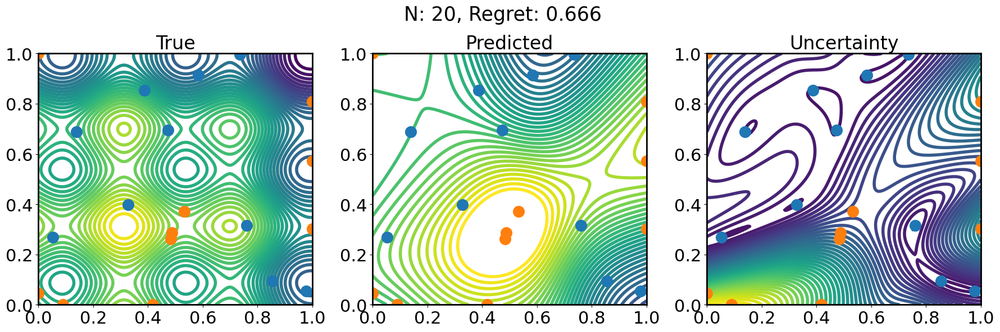

Max replicates exceeded, switching to pure exploration


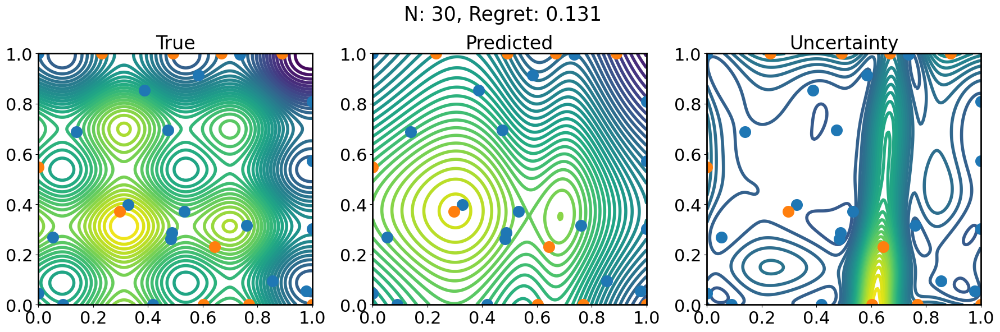

Max replicates exceeded, switching to pure exploration


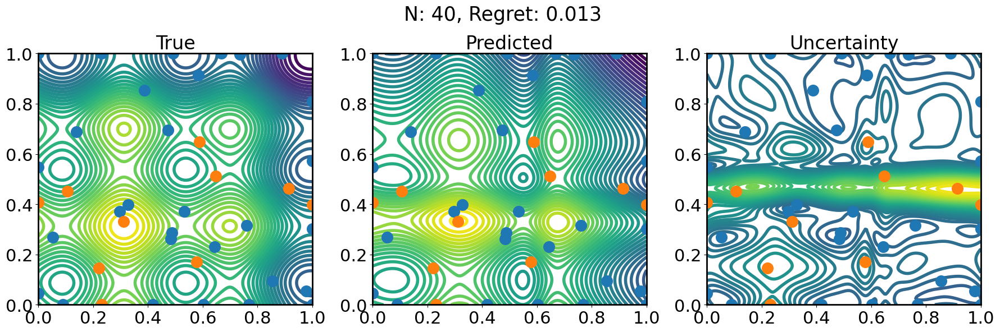

Max replicates exceeded, switching to pure exploration


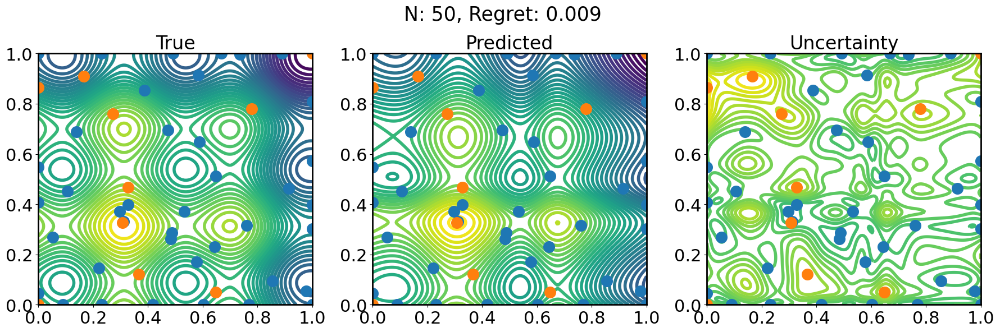

Max replicates exceeded, switching to pure exploration


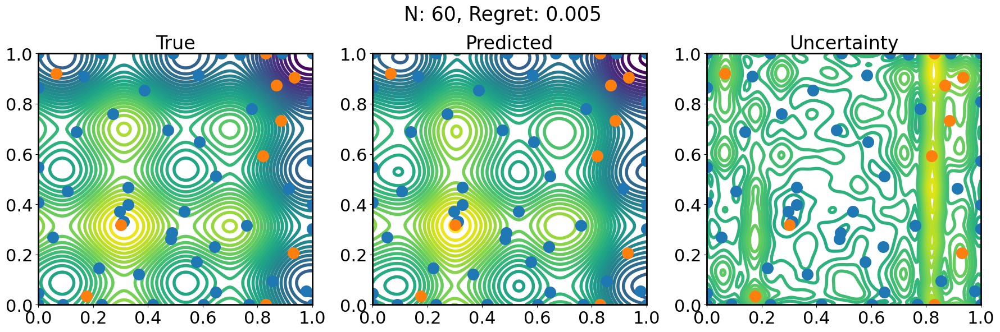

In [5]:
stdv_levels = np.exp(.15*np.linspace(0, 20, n_grid//5)) -1 

# life
regret = np.inf

# BO over cycles
for i in range(n_cycles):
    # scale data
    Xscaler = StandardScaler().fit(X_train)
    X_train = Xscaler.transform(X_train)
    X_test  = Xscaler.transform(X_design)

    Yscaler = StandardScaler().fit(np.vstack(Y_train))
    Y_train = Yscaler.transform(np.vstack(Y_train))
    Y_test  = Yscaler.transform(np.vstack(Y_design))

    n_inputs = X_train.shape[1]
    n_outputs = Y_train.shape[1]

    ffnn = FFNN(n_inputs, n_hidden, n_outputs)
    # print(f"Number of model parameters: {ffnn.n_params}")

    t0 = time.time()
    ffnn.fit(X_train, Y_train, map_tol=1e-5)
    # print("Elapsed time: {:.3f} s".format(time.time()-t0))

    # Design next experiment

    # Expected improvement objective
    fstar = np.max(Y_train)
    def objective(pred, stdv):
        improvement = pred - fstar
        Z = improvement/stdv
        return improvement*cdf(Z) + stdv*pdf(Z)

    # search for new data points
    design_inds = ffnn.search(X_test, objective, n_test)
    X_old = Xscaler.inverse_transform(X_train) 
    Y_old = Yscaler.inverse_transform(Y_train)
    X_new = X_design[design_inds]
    Y_new = Y_design[design_inds]

    # plot model approximation of objective and uncertainty
    Y, Y_stdv, COV = ffnn.predict(X_test)

    F_pred = np.reshape(Yscaler.inverse_transform(Y), [n_grid, n_grid])
    F_stdv = np.reshape(Yscaler.scale_*Y_stdv, [n_grid, n_grid])
    Y_min = np.min(Y_design)
    Y_max = np.max(Y_design)

    plt.figure(figsize=(18, 6))
    plt.subplot(131)
    plt.contour(Xmesh, Ymesh, F_grid, levels=np.linspace(Y_min, Y_max, n_grid//5), zorder=0)  
    plt.scatter(X_old[:,0], X_old[:,1], s=200, zorder=1)
    plt.scatter(X_new[:,0], X_new[:,1], s=200, zorder=2)
    plt.title("True")

    plt.subplot(132)
    plt.contour(Xmesh, Ymesh, F_pred, levels=np.linspace(Y_min, Y_max, n_grid//5), zorder=0)
    plt.scatter(X_old[:,0], X_old[:,1], s=200, zorder=1)
    plt.scatter(X_new[:,0], X_new[:,1], s=200, zorder=2)
    plt.title("Predicted")

    plt.subplot(133)
    # plt.contour(Xmesh, Ymesh, F_stdv, levels=stdv_levels, zorder=0)
    plt.contour(Xmesh, Ymesh, F_stdv, levels=np.linspace(0., np.max(F_stdv), n_grid//5), zorder=0)
    plt.scatter(X_old[:,0], X_old[:,1], s=200, zorder=1)
    plt.scatter(X_new[:,0], X_new[:,1], s=200, zorder=2)
    plt.title("Uncertainty")

    # compute regret
    regret = min([regret, np.max(Y_design) - np.max(Y_new)])
    plt.suptitle("N: {:.0f}, Regret: {:.3f}".format(X_train.shape[0]+X_new.shape[0], regret), fontsize=25)
    plt.tight_layout()
    plt.savefig(f"Results/Cosines_DTL_{i}.pdf")
    plt.show()
    # break

    # update training data with new design (AVERAGE OVER REPLICATES)
    
    # matrix to average over replicate samples
    unique_designs, counts = np.unique(design_inds, return_counts=True)
    C = np.zeros([len(unique_designs), len(design_inds)])
    k = 0
    for i,c in enumerate(counts):
        C[i,k:k+c] = 1.
        k += c

    # sample several replicates of response
    Y_new = generate_data(X_new, noise=noise)

    # average over replicates
    X_new = np.einsum('nm,mk,n->nk', C, X_new, 1./counts) 
    Y_new = np.einsum('nm,mk,n->nk', C, Y_new, 1./counts) 
    
    # update training data with new data 
    X_train = np.concatenate((X_old, X_new))
    Y_train = np.concatenate((Y_old, Y_new))

In [6]:
@jit
def sample(mu, cov, rng):        
    
    # set rng
    rng_key = random.PRNGKey(rng)
    
    # cholesky factorization of covariance
    L = jnp.linalg.cholesky(cov)
    
    # standard normal random vector
    z = random.normal(rng_key, shape=(len(mu),))
    
    # transform so that sample has E[s] = mu, cov[s] = cov
    return mu + jnp.dot(z, L.T)

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


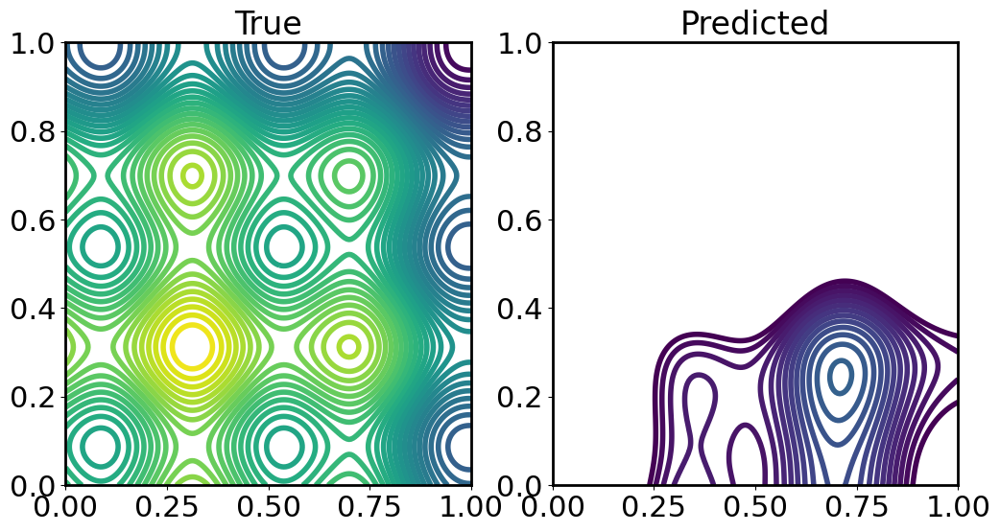

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


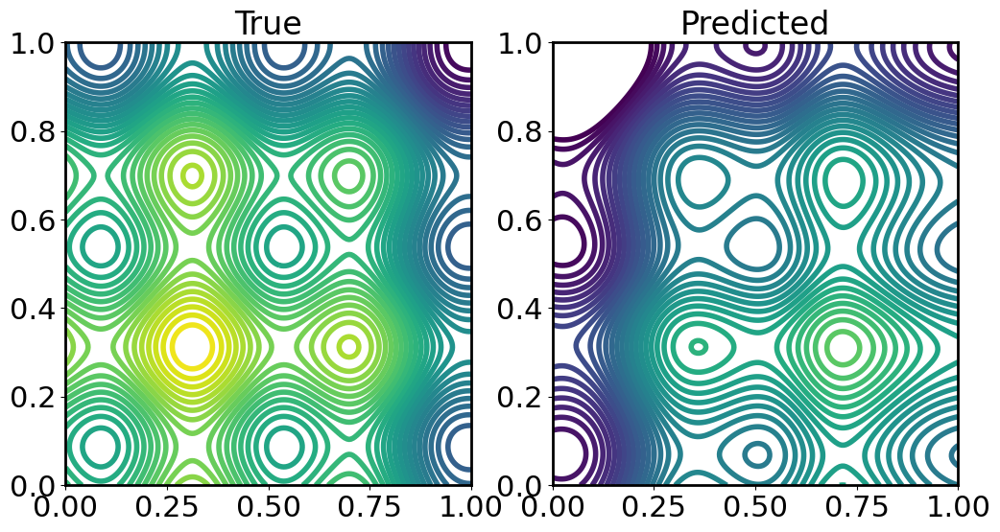

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


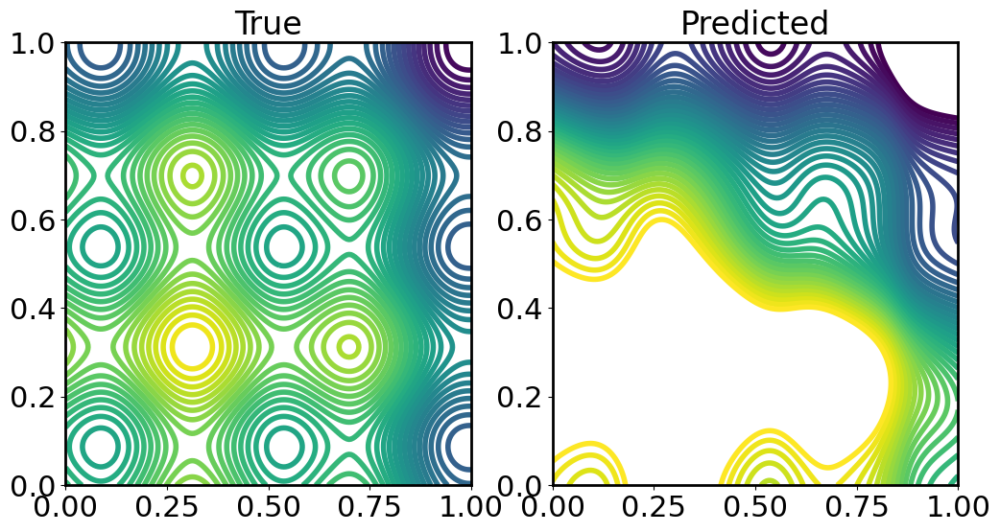

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


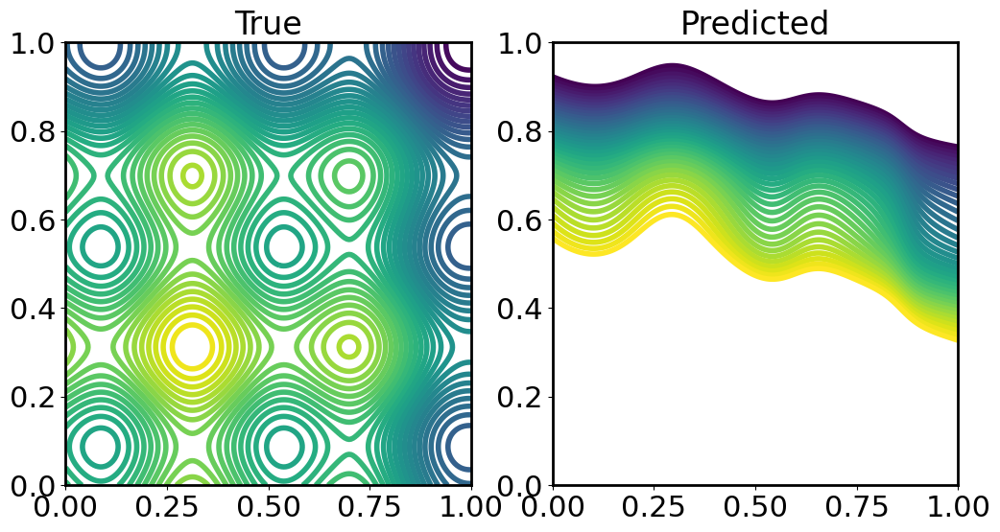

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


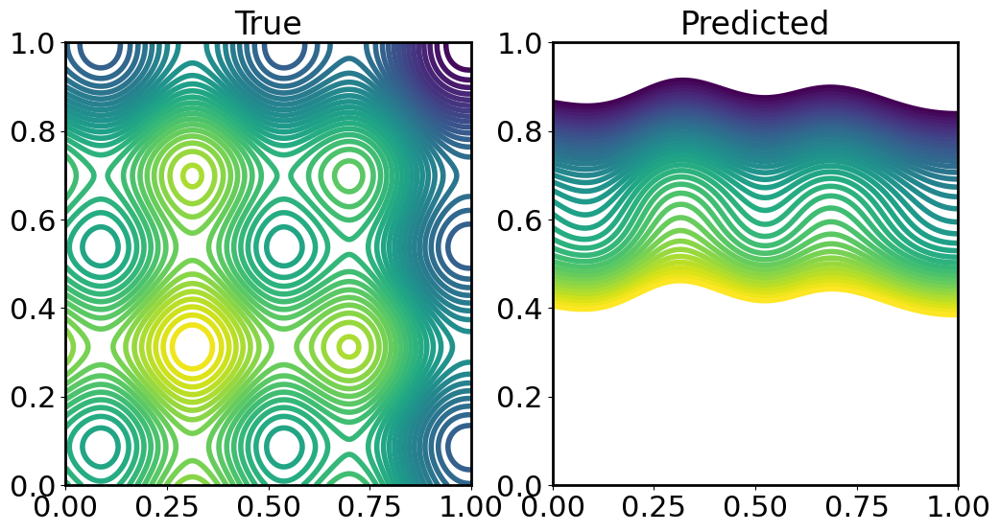

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


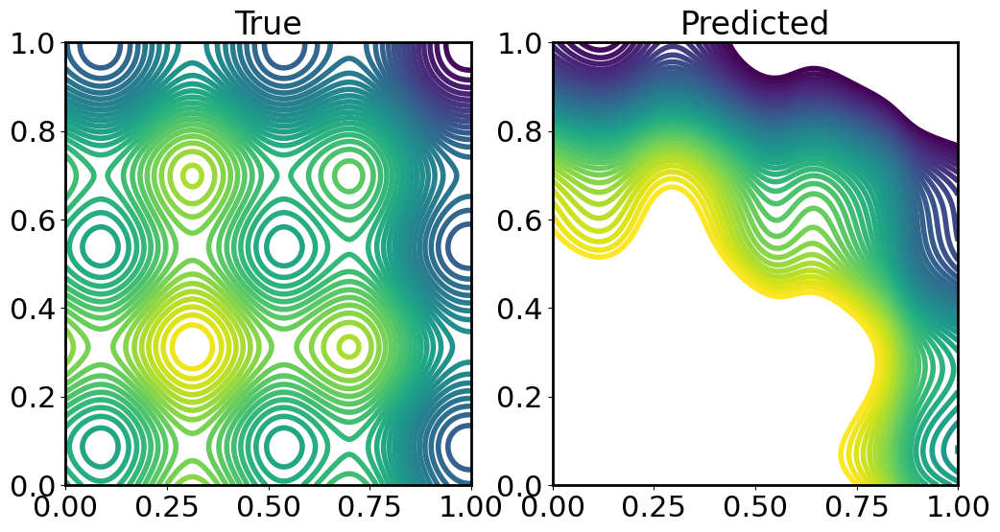

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


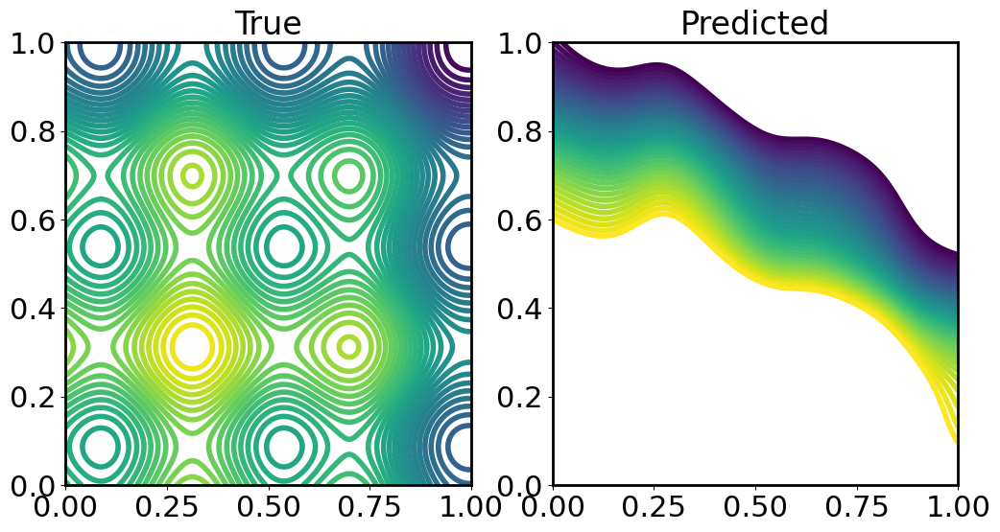

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


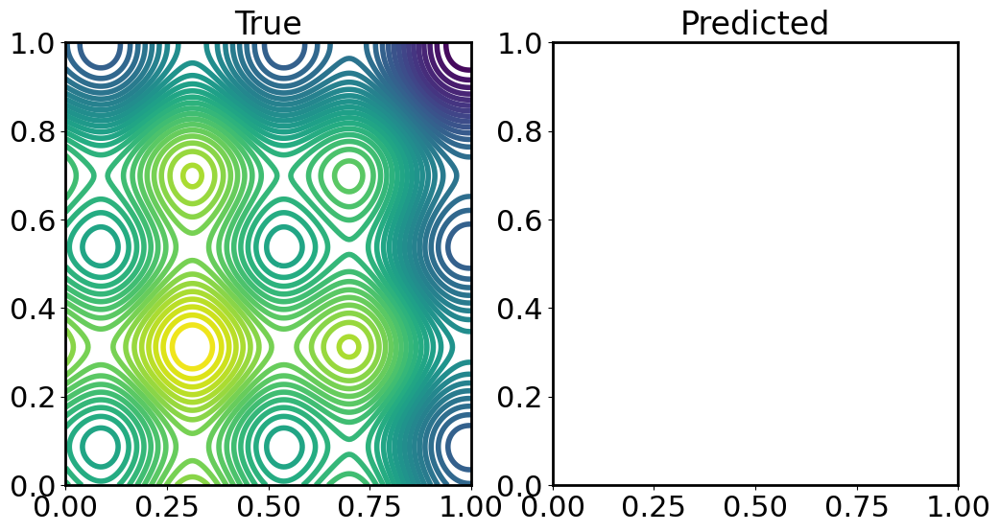

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


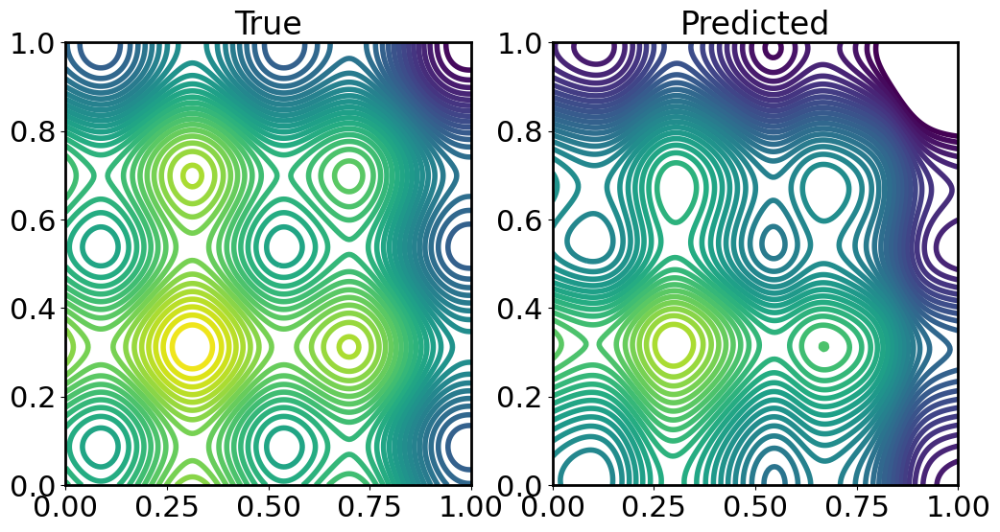

[-8.9911865e-03 -2.4882228e+00  3.3458099e+00  7.6228948e-03
 -2.0227349e-06]


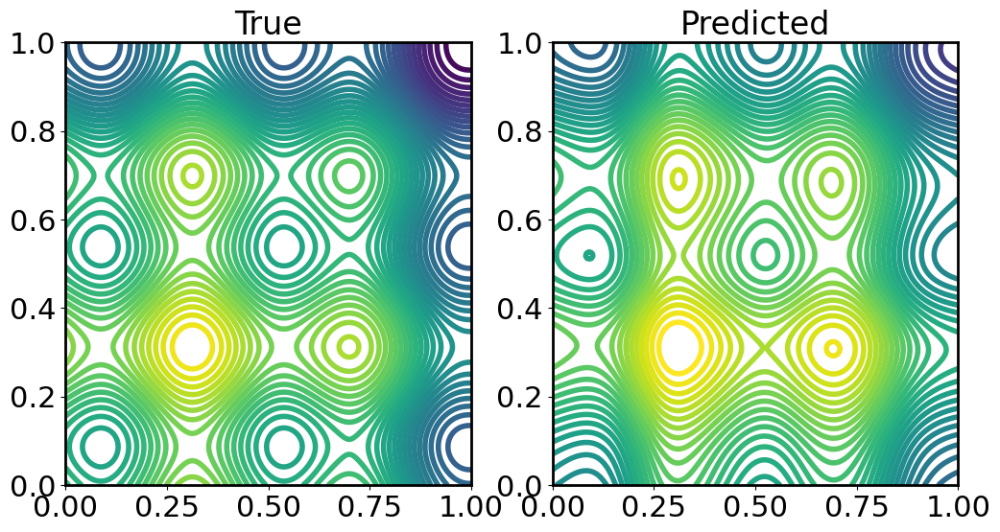

In [7]:
mu = np.copy(ffnn.params)
Ainv = np.copy(ffnn.Ainv)

for k in range(10):
    ffnn.params = sample(mu, Ainv, k)
    # plot model approximation of objective and uncertainty
    Y, Y_stdv, _ = ffnn.predict(X_test)

    F_pred = np.reshape(Yscaler.inverse_transform(Y), [n_grid, n_grid])
    F_stdv = np.reshape(Yscaler.scale_*Y_stdv, [n_grid, n_grid])
    Y_min = np.min(Y_design)
    Y_max = np.max(Y_design)

    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.contour(Xmesh, Ymesh, F_grid, levels=np.linspace(Y_min, Y_max, n_grid//5), zorder=0)  
    plt.title("True")

    plt.subplot(122)
    plt.contour(Xmesh, Ymesh, F_pred, levels=np.linspace(Y_min, Y_max, n_grid//5), zorder=0)
    plt.title("Predicted")
    
    plt.show()